### > install packages

In [1]:
!pip install -Uq diffusers==0.25.0
!pip install -Uq opencv-python-headless

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
autotrain-advanced 0.6.58 requires diffusers==0.21.4, but you have diffusers 0.25.0 which is incompatible.


### > Setup

In [1]:
from transformers import DPTFeatureExtractor, DPTForDepthEstimation

from diffusers import (
DiffusionPipeline,
StableDiffusionXLControlNetPipeline,
ControlNetModel, 
StableDiffusionXLImg2ImgPipeline,
UNet2DConditionModel, 
AutoencoderKL,
LCMScheduler)

import numpy as np
from PIL import Image

import torch
from diffusers.utils import load_image, make_image_grid
import gc

device_count = torch.cuda.device_count()
assert device_count > 0, "No GPU devices detected."

print("Number of available GPU devices:", device_count)

device = torch.device("cuda:3")

model_id = "stabilityai/stable-diffusion-xl-base-1.0"
lcm_lora_id = "latent-consistency/lcm-lora-sdxl"

lcm_unet_id = "latent-consistency/lcm-sdxl"
depth_extraction_id="Intel/dpt-hybrid-midas"

sdxl_vae_id="madebyollin/sdxl-vae-fp16-fix"

controlnet_depth_id="diffusers/controlnet-depth-sdxl-1.0"

2024-01-11 13:39:40.872277: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Number of available GPU devices: 4


### > Generate depth map

In [2]:
depth_estimator = DPTForDepthEstimation.from_pretrained(depth_extraction_id).to(device)
feature_extractor = DPTFeatureExtractor.from_pretrained(depth_extraction_id)

def get_depth_map(image):
    image = feature_extractor(images=image, return_tensors="pt").pixel_values.to(device)
    with torch.no_grad(), torch.autocast("cuda"):
        depth_map = depth_estimator(image).predicted_depth

    depth_map = torch.nn.functional.interpolate(
        depth_map.unsqueeze(1),
        size=(1024, 1024),
        mode="bicubic",
        align_corners=False,
    )
    depth_min = torch.amin(depth_map, dim=[1, 2, 3], keepdim=True)
    depth_max = torch.amax(depth_map, dim=[1, 2, 3], keepdim=True)
    depth_map = (depth_map - depth_min) / (depth_max - depth_min)
    image = torch.cat([depth_map] * 3, dim=1)

    image = image.permute(0, 2, 3, 1).cpu().numpy()[0]
    image = Image.fromarray((image * 255.0).clip(0, 255).astype(np.uint8))
    return image

/opt/conda/lib/python3.10/site-packages/transformers/models/dpt/feature_extraction_dpt.py:28: FutureWarning: The class DPTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DPTImageProcessor instead.
  warnings.warn(


### > Full fine tuning text-to-image

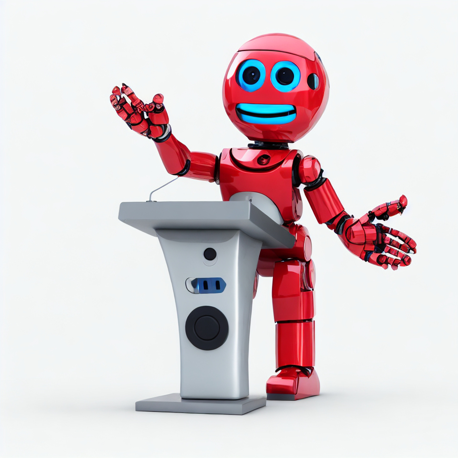

In [3]:
prompt = "spidey lecture, photorealistic"
image = load_image("https://huggingface.co/lllyasviel/sd-controlnet-depth/resolve/main/images/stormtrooper.png")
image

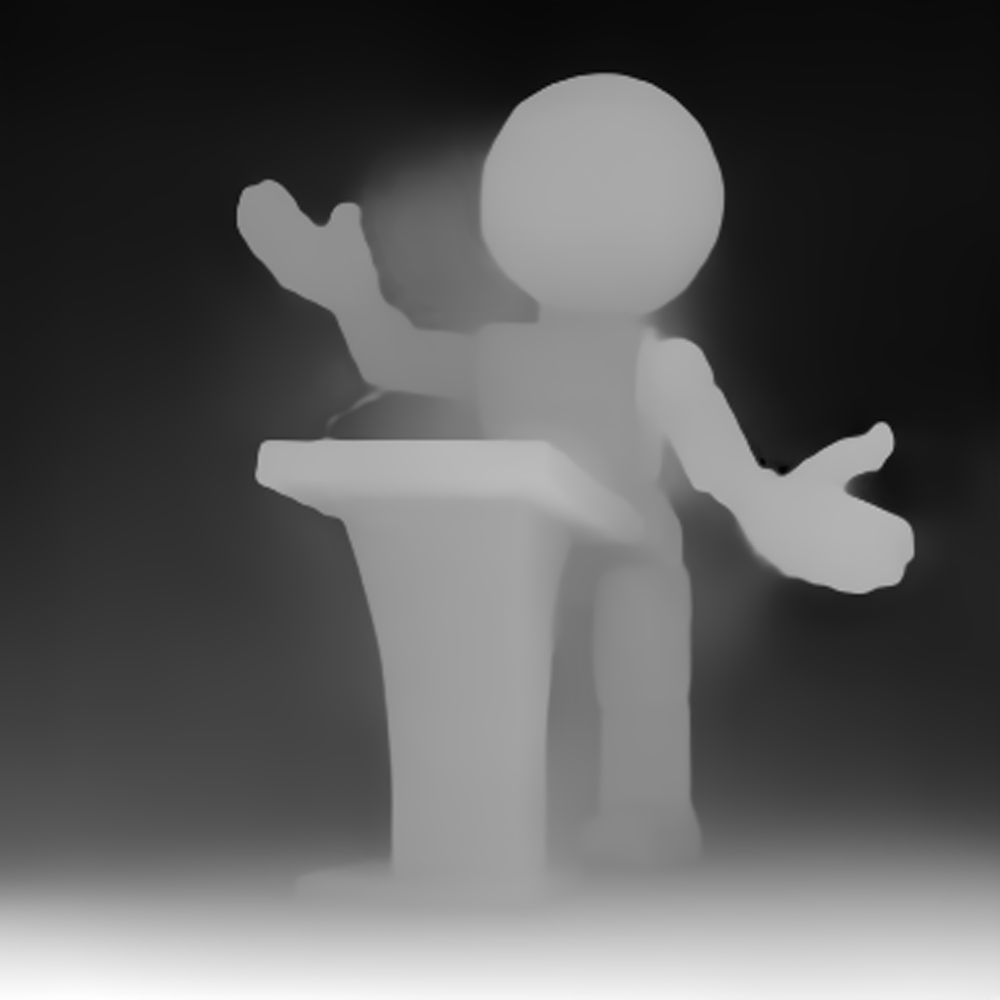

In [4]:
## get depth image
depth_image = get_depth_map(image)
depth_image

### > Load model

In [5]:
unet = UNet2DConditionModel.from_pretrained(
    lcm_unet_id,
    torch_dtype=torch.float16,
    variant="fp16",
)

controlnet = ControlNetModel.from_pretrained(
    controlnet_depth_id,
    variant="fp16",
    use_safetensors=True,
    torch_dtype=torch.float16,
).to(device)

vae = AutoencoderKL.from_pretrained(sdxl_vae_id, torch_dtype=torch.float16)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    model_id, 
    controlnet=controlnet, 
    vae=vae,
    unet=unet,
    torch_dtype=torch.float16
).to(device)

pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


In [6]:
%%time
generator = torch.manual_seed(0)
image = pipe(
    prompt=prompt,
    # negative_prompt=negative_prompt,
    image=depth_image,
    num_inference_steps=4,
    guidance_scale=1.5,
    controlnet_conditioning_scale=0.8,
    cross_attention_kwargs={"scale": 1},
    generator=generator,
).images[0]

  0%|          | 0/4 [00:00<?, ?it/s]

CPU times: user 10.7 s, sys: 1.11 s, total: 11.8 s
Wall time: 2.02 s


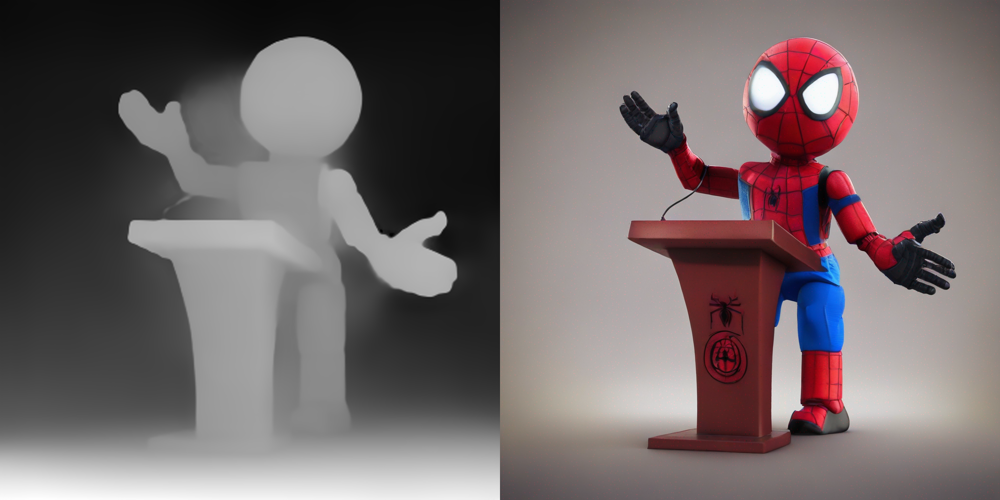

In [7]:
make_image_grid([depth_image, image], rows=1, cols=2)

In [8]:
# del pipe
# gc.collect()
# torch.cuda.empty_cache()

### > Apply to video filtering

In [9]:
CDN_URL = "https://d2yqlwoly7fl0b.cloudfront.net/super-slomo"

SAMPLE_VIDEO = "westiepoo.mov"
!wget -L {CDN_URL}/samples/{SAMPLE_VIDEO} -O {SAMPLE_VIDEO}

--2024-01-11 13:43:53--  https://d2yqlwoly7fl0b.cloudfront.net/super-slomo/samples/westiepoo.mov
Resolving d2yqlwoly7fl0b.cloudfront.net (d2yqlwoly7fl0b.cloudfront.net)... 18.161.3.85, 18.161.3.178, 18.161.3.7, ...
Connecting to d2yqlwoly7fl0b.cloudfront.net (d2yqlwoly7fl0b.cloudfront.net)|18.161.3.85|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8908629 (8.5M) [video/quicktime]
Saving to: ‘westiepoo.mov’

westiepoo.mov       100%[===================>]   8.50M  --.-KB/s    in 0.05s   

2024-01-11 13:43:53 (178 MB/s) - ‘westiepoo.mov’ saved [8908629/8908629]



### > Preview video

In [10]:
from IPython.display import Video, Image, display

Video(SAMPLE_VIDEO, width=640, height=360)

Extract frames

In [11]:
import helper

frame_dir = helper.extract_frames(SAMPLE_VIDEO)

!ls {frame_dir}

/tmp/353123/frame-%07d.jpg


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

frame-0000001.jpg  frame-0000026.jpg  frame-0000051.jpg  frame-0000076.jpg
frame-0000002.jpg  frame-0000027.jpg  frame-0000052.jpg  frame-0000077.jpg
frame-0000003.jpg  frame-0000028.jpg  frame-0000053.jpg  frame-0000078.jpg
frame-0000004.jpg  frame-0000029.jpg  frame-0000054.jpg  frame-0000079.jpg
frame-0000005.jpg  frame-0000030.jpg  frame-0000055.jpg  frame-0000080.jpg
frame-0000006.jpg  frame-0000031.jpg  frame-0000056.jpg  frame-0000081.jpg
frame-0000007.jpg  frame-0000032.jpg  frame-0000057.jpg  frame-0000082.jpg
frame-0000008.jpg  frame-0000033.jpg  frame-0000058.jpg  frame-0000083.jpg
frame-0000009.jpg  frame-0000034.jpg  frame-0000059.jpg  frame-0000084.jpg
frame-0000010.jpg  frame-0000035.jpg  frame-0000060.jpg  frame-0000085.jpg
frame-0000011.jpg  frame-0000036.jpg  frame-0000061.jpg  frame-0000086.jpg
frame-0000012.jpg  frame-0000037.jpg  frame-0000062.jpg  frame-0000087.jpg
frame-0000013.jpg  frame-0000038.jpg  frame-0000063.jpg  frame-0000088.jpg
frame-0000014.jpg  frame-

### > Preview a random frame

(1920, 1080)


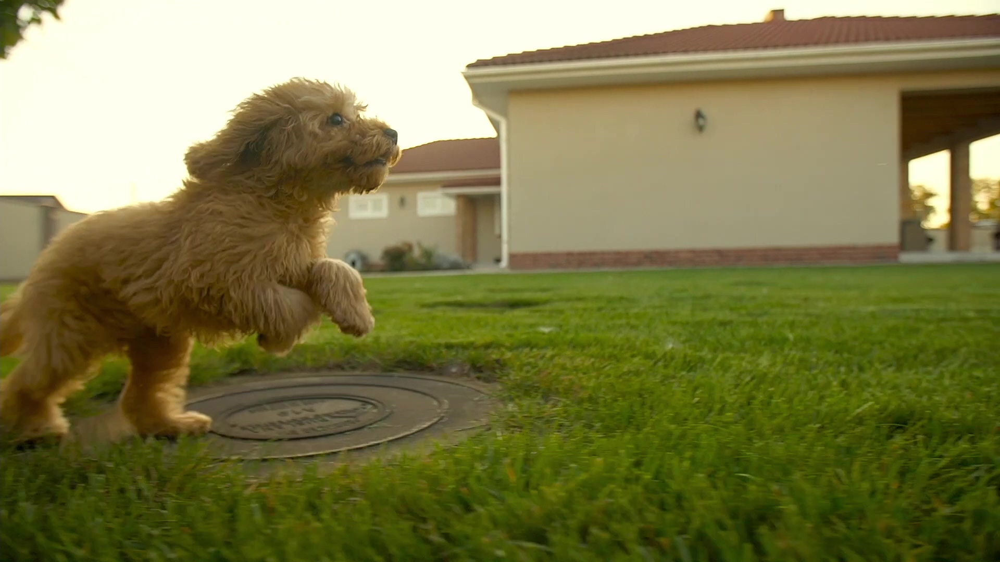

In [12]:
import os
import random
from PIL import Image

def preview_random_image(folder_path):
    # Get the list of image files in the folder
    image_files = [file for file in os.listdir(folder_path) if file.endswith((".jpg", ".jpeg", ".png"))]
    
    # Select a random image file
    random_image_file = random.choice(image_files)

    # Open the image
    image_path = os.path.join(folder_path, random_image_file)

    image = Image.open(image_path)

    print(image.size)

    # Display the image
    display(image)
    return image

init_image = preview_random_image(frame_dir)

In [13]:
from PIL import Image

def scale_image(image, width=None, height=None):
    # Get the original size of the image
    original_width, original_height = image.size

    # Calculate the scaling factors for width and height
    width_scale = width / original_width if width else height / original_height
    height_scale = height / original_height if height else width / original_width

    # Determine the final size based on the scaling factors
    new_width = int(original_width * width_scale)
    new_height = int(original_height * height_scale)

    # Scale the image to the new size
    scaled_image = image.resize((new_width, new_height))

    return scaled_image

In [22]:
original_w, original_h = init_image.size

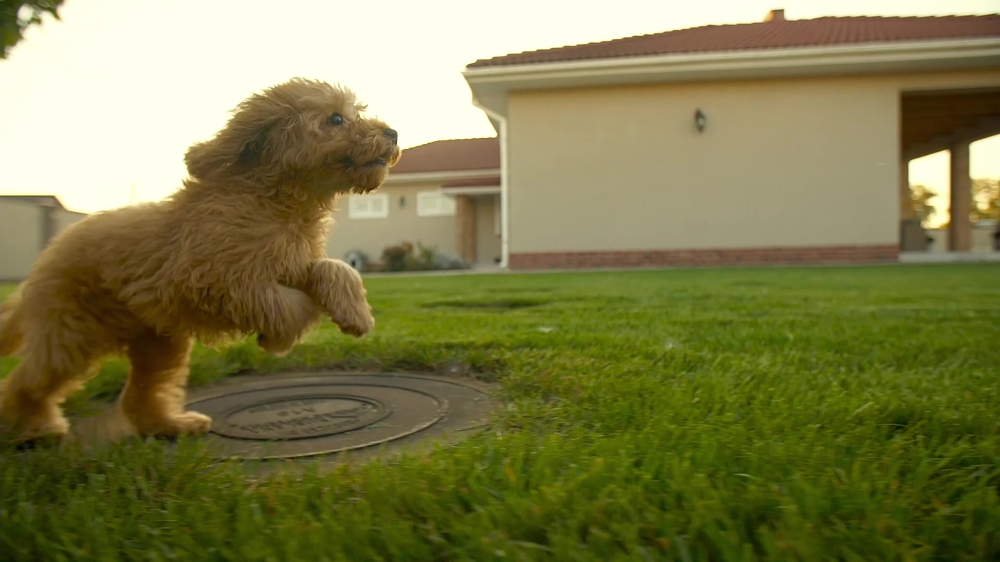

In [23]:
scaled_image = scale_image(init_image, height=1024)
scaled_image

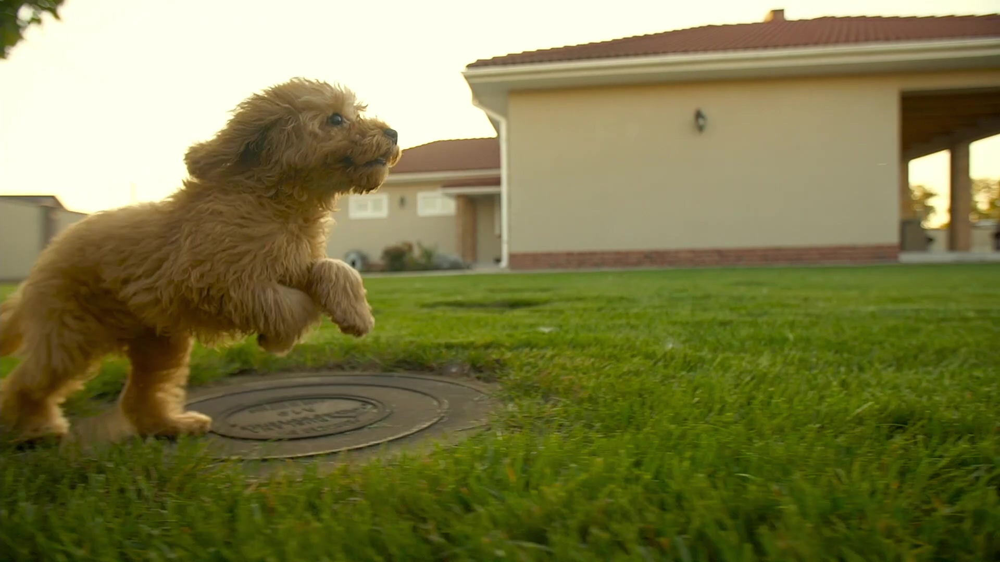

In [24]:
scaled_back_image = scale_image(scaled_image, width=original_w, height=original_h)
scaled_back_image

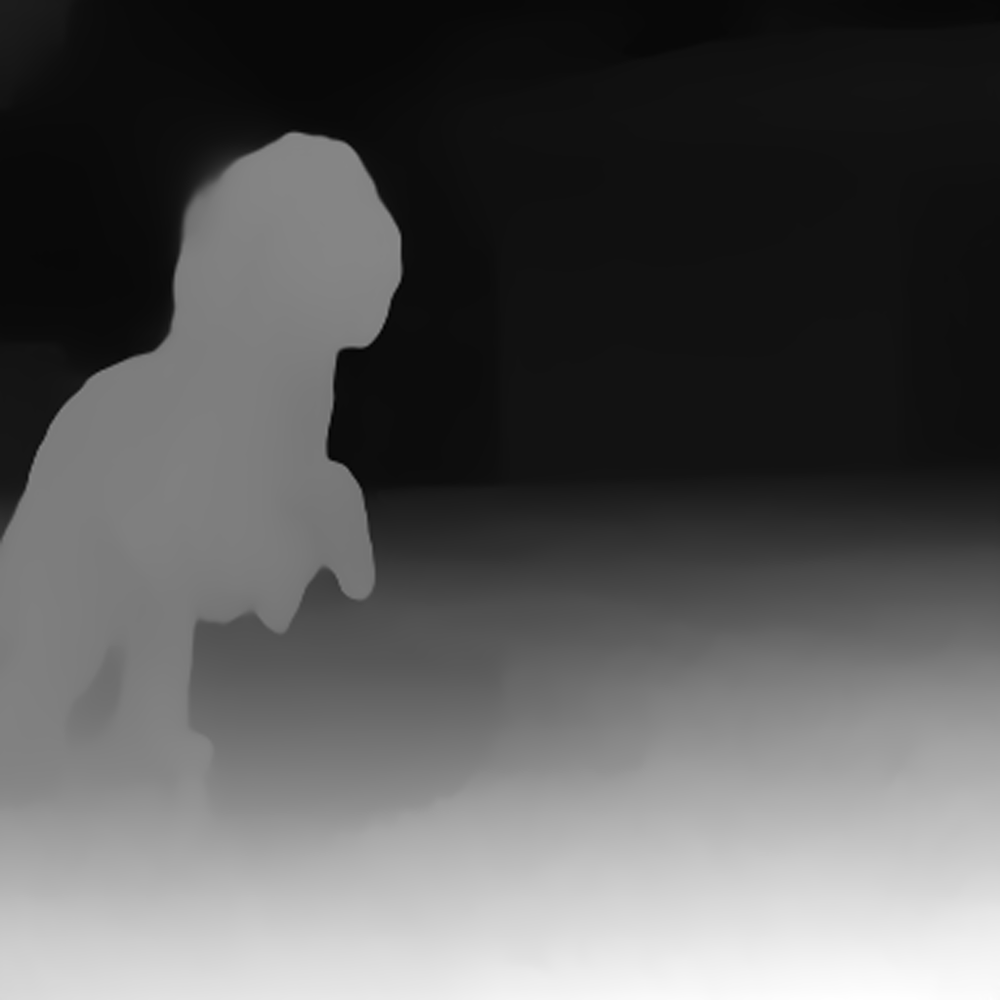

In [25]:
depth_image = get_depth_map(scaled_image)
depth_image

  0%|          | 0/4 [00:00<?, ?it/s]

CPU times: user 10.7 s, sys: 1.01 s, total: 11.7 s
Wall time: 1.95 s


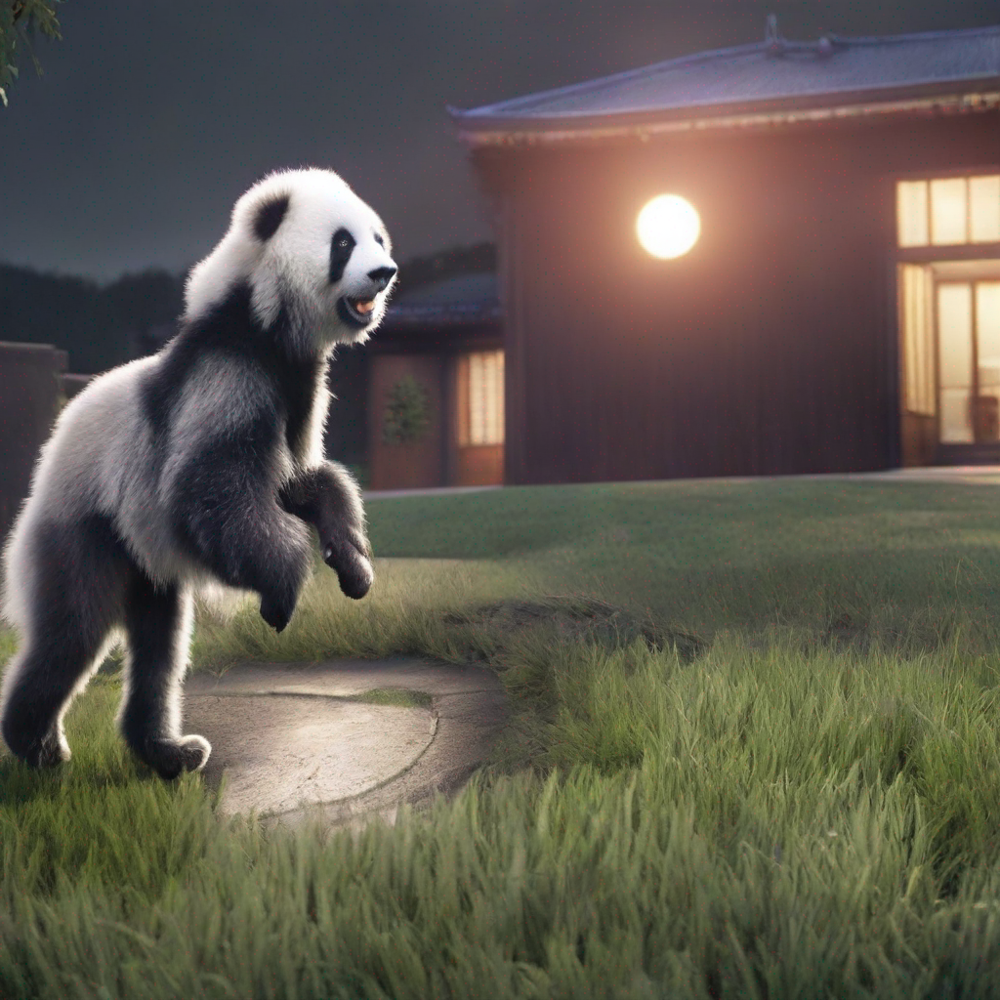

In [27]:
%%time
prompt="cute panda running, bamboo tree in to background, dark night, large moon, realistic, highly detailed, 8k"
negative_prompt = "extra digit, fewer digits, cropped, worst quality, low quality, glitch, deformed, mutated, ugly, disfigured"

generator = torch.manual_seed(0)
image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=depth_image,
    num_inference_steps=4,
    guidance_scale=1.5,
    controlnet_conditioning_scale=0.8,
    cross_attention_kwargs={"scale": 1.0},
    generator=generator,
).images[0]

image

### > Process the frames

In [28]:
from pathlib import Path
    
output_dir = Path(f"/tmp/{random.randint(0, 1000000)}")
while output_dir.exists():
    output_dir = Path(f"/tmp/{random.randint(0, 1000000)}")
    
output_dir.mkdir(parents=True, exist_ok=False)

In [29]:
# Get the list of image files in the input folder
image_files = [file for file in os.listdir(frame_dir) if file.endswith((".jpg", ".jpeg", ".png"))]

# Process each image file
for image_file in image_files:
    # Load the image
    image_path = os.path.join(frame_dir, image_file)
    init_image = Image.open(image_path)

    original_w, original_h = init_image.size

    # scale images down
    scaled_down_image = scale_image(init_image, height=1024)

    depth_image = get_depth_map(scaled_down_image)

    # process the image
    new_image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=depth_image,
        num_inference_steps=4,
        guidance_scale=1.5,
        controlnet_conditioning_scale=0.8,
        cross_attention_kwargs={"scale": 1.0},
        generator=generator,
    ).images[0]
    
    scaled_back_image = scale_image(new_image, 
                                    width=original_w, height=original_h)

    output_path = os.path.join(output_dir, image_file)
    scaled_back_image.save(output_path)

    print(f"Processed image saved: {output_path}")

  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000001.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000002.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000003.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000004.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000005.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000006.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000007.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000008.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000009.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000010.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000011.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000012.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000013.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000014.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000015.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000016.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000017.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000018.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000019.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000020.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000021.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000022.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000023.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000024.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000025.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000026.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000027.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000028.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000029.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000030.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000031.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000032.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000033.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000034.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000035.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000036.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000037.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000038.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000039.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000040.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000041.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000042.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000043.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000044.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000045.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000046.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000047.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000048.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000049.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000050.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000051.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000052.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000053.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000054.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000055.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000056.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000057.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000058.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000059.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000060.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000061.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000062.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000063.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000064.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000065.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000066.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000067.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000068.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000069.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000070.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000071.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000072.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000073.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000074.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000075.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000076.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000077.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000078.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000079.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000080.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000081.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000082.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000083.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000084.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000085.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000086.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000087.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000088.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000089.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000090.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000091.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000092.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000093.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000094.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000095.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000096.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000097.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000098.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000099.jpg


  0%|          | 0/4 [00:00<?, ?it/s]

Processed image saved: /tmp/213363/frame-0000100.jpg
